## Image Classifier

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
from skimage.io import imshow, imsave, imread
import torch 
import torchvision
import torch.nn as nn
from PIL import Image

In [ ]:
# read in data csv pointing to files
meme_data = pd.read_csv('drive/MyDrive/Colab Notebooks/meme_df/meme-generator-dataset/memegendf.csv')
meme_data['labels'] = 0 # 0 for memes

In [ ]:
# read in inspirational quotes csv
quotes_data = pd.read_csv('drive/MyDrive/Colab Notebooks/meme_df/meme-generator-dataset/inspirational.csv')
quotes_data['labels'] = 1 # 0 for memes

In [ ]:
meme_data.head()

,Unnamed: 0,Unnamed: 0.1,Meme ID,Archived URL,Base Meme Name,Meme Page URL,MD5 Hash,File Size (In Bytes),Alternate Text,Display Name,Upper Text,Lower Text,Meme Text,New URLs,Filenames,labels
352,1269,5661,10594946.0,http://webarchive.loc.gov/all/0/http://cdn.mem...,College Freshman,http://memegenerator.net/instance/10594946,0a427fd5d3e9107089259be6545da355,68061.0,Misses class Brings doctors note,College Freshman,Misses class,lET U gO hOME?,Misses class lET U gO hOME?,https://memegenerator.net/img/instances/105949...,10594946.jpg,0
1172,4833,17781,13445721.0,http://webarchive.loc.gov/all/0/http://cdn.mem...,El Tano Pasman,https://memegenerator.net/instance/13445721/el...,d6a08d818ba30a87e9d33c8025e99459,48125.0,NOOOOO MEGAUPLOAD NOOOOO FBI LA PUTA QUE TE PA...,El Tano Pasman,NOOOOO MEGAUPLOAD NOOOOO,where the petitions get signed but the signatu...,NOOOOO MEGAUPLOAD NOOOOO where the petitions g...,https://memegenerator.net/img/instances/134457...,13445721.jpg,0
40,151,947,10230572.0,http://webarchive.loc.gov/all/0/http://cdn.mem...,fyeahswimshark,http://memegenerator.net/instance/10230572,2e0c2ba80fec18c0062af1a5a1dabb56,41569.0,hurt shoulder a week before season starts main...,fyeahswimshark,hurt shoulder a week before season starts,"shins turn various shades of green, yellow, bl...",hurt shoulder a week before season starts shin...,https://memegenerator.net/img/instances/102305...,10230572.jpg,0
657,2590,10030,11179541.0,http://webarchive.loc.gov/all/0/http://cdn.mem...,PTSD Clarinet Boy,http://memegenerator.net/instance/11179541,db28a82f2d16465300632feffa0f2091,60680.0,they laughed at me at school i laughed at thie...,PTSD Clarinet Boy,they laughed at me at school,da igual,they laughed at me at school da igual,https://memegenerator.net/img/instances/111795...,11179541.jpg,0
224,777,3719,10422461.0,http://webarchive.loc.gov/all/0/http://cdn.mem...,David Caruso CSI,http://memegenerator.net/instance/10422461,5a532deb41a2dff4ad7a4cd4a49a713d,50924.0,Looks like that latest bunch of apples is alre...,David Caruso CSI,Looks like that latest bunch of apples,tirate un caso,Looks like that latest bunch of apples tirate ...,https://memegenerator.net/img/instances/104224...,10422461.jpg,0


In [ ]:
quotes_data.head()

,0,file_name,text,labels
0,1,1.jpg,"if you get tired, learn to rest, not to quit.",1
1,2,2.jpg,dare to trust yourself,1
2,3,3.jpg,christ your key to true power,1
3,4,4.jpg,know that dream cometrue,1
4,5,5.jpg,does your mind focus on fun,1


In [ ]:
meme_data = meme_data.sample(1000)

In [ ]:
meme_df = pd.DataFrame({
    'filenames': list(meme_data['Filenames']) + list(quotes_data['file_name']),
    'labels': list(meme_data['labels']) + list(quotes_data['labels']),
    'text': list(meme_data['Meme Text']) + list(quotes_data['text'])
})

In [ ]:
meme_df.to_csv("drive/MyDrive/Colab Notebooks/meme_df/meme-generator-dataset/combined_img_df.csv")

In [ ]:
meme_df

,filenames,labels,text
0,10594946.jpg,0,Misses class lET U gO hOME?
1,13445721.jpg,0,NOOOOO MEGAUPLOAD NOOOOO where the petitions g...
2,10230572.jpg,0,hurt shoulder a week before season starts shin...
3,11179541.jpg,0,they laughed at me at school da igual
4,10422461.jpg,0,Looks like that latest bunch of apples tirate ...
...,...,...,...
1995,996.jpg,1,the difficulty lies not so much in developing ...
1996,997.jpg,1,today's inspirational quote don't be a dick
1997,998.jpg,1,be the light that helps others see
1998,999.jpg,1,every saint has a past and every sinner has a ...


In [ ]:
memes = []
labels = []
transforms = torchvision.transforms.Compose([
    torchvision.transforms.Resize(256),
    torchvision.transforms.CenterCrop(224),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
path = 'drive/MyDrive/Colab Notebooks/meme_df/meme-generator-dataset/memegenimages/'
for j, i in enumerate(meme_df['filenames'][:1000]):
  curr_path = path + i
  try:
    curr_meme = Image.open(curr_path)
    curr_meme = transforms(curr_meme)
    curr_meme = curr_meme.permute(1, 2, 0)
    memes.append(curr_meme.numpy())
    labels.append(meme_df['labels'][j])
  except:
    continue
path = 'drive/MyDrive/Colab Notebooks/meme_df/meme-generator-dataset/inspirationalquotes/'
for j, i in enumerate(meme_df['filenames'][1000:]):
  curr_path = path + i
  try:
    curr_meme = Image.open(curr_path)
    curr_meme = transforms(curr_meme)
    curr_meme = curr_meme.permute(1, 2, 0)
    memes.append(curr_meme.numpy())
    labels.append(meme_df['labels'][j+1000])
  except:
    continue

In [ ]:
len(memes)

1992

In [ ]:
import numpy as np
from tensorflow import keras
from tensorflow.keras import layers
from random import sample

In [ ]:
indices = [i for i in range(1992)]

In [ ]:
train_idx = sample(indices, 1395)
test_idx = [i for i in indices if i not in train_idx]

In [ ]:
x_train = []
x_test = []
y_train = []
y_test = []
for i in train_idx:
  x_train.append(memes[i])
  y_train.append(labels[i])
for i in test_idx:
  x_test.append(memes[i])
  y_test.append(labels[i])

In [ ]:
import tensorflow as tf

try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
    print("Running on TPU ", tpu.cluster_spec().as_dict()["worker"])
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except ValueError:
    print("Not connected to a TPU runtime. Using CPU/GPU strategy")
    strategy = tf.distribute.MirroredStrategy()

Not connected to a TPU runtime. Using CPU/GPU strategy
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


In [ ]:
train_dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train))
test_dataset = tf.data.Dataset.from_tensor_slices((x_test, y_test))

In [ ]:
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers

img_augmentation = Sequential(
    [
        preprocessing.RandomRotation(factor=0.15),
        preprocessing.RandomTranslation(height_factor=0.1, width_factor=0.1),
        preprocessing.RandomFlip(),
        preprocessing.RandomContrast(factor=0.1),
    ],
    name="img_augmentation",
)

In [ ]:
NUM_CLASSES = 2
IMG_SIZE = 224
batch_size = 64

# prepare inputs
# One-hot / categorical encoding
def input_preprocess(image, label):
    label = tf.one_hot(label, NUM_CLASSES)
    return image, label


ds_train = train_dataset.map(
    input_preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE
)
ds_train = ds_train.batch(batch_size=batch_size, drop_remainder=True)
ds_train = ds_train.prefetch(tf.data.experimental.AUTOTUNE)

ds_test = test_dataset.map(input_preprocess)
ds_test = ds_test.batch(batch_size=batch_size, drop_remainder=True)

In [ ]:
# train efficient net model from scratch
from tensorflow.keras.applications import EfficientNetB0

with strategy.scope():
    inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    x = img_augmentation(inputs)
    outputs = EfficientNetB0(include_top=True, weights=None, classes=NUM_CLASSES)(x)

    model = tf.keras.Model(inputs, outputs)
    model.compile(
        optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"]
    )

model.summary()

epochs = 20

hist = model.fit(ds_train, epochs=epochs, validation_data=ds_test, verbose=2)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 img_augmentation (Sequentia  (None, 224, 224, 3)      0         
 l)                                                              
                                                                 
 efficientnetb0 (Functional)  (None, 2)                4052133   
                                                                 
Total params: 4,052,133
Trainable params: 4,010,110
Non-trainable params: 42,023
_________________________________________________________________
Epoch 1/20
21/21 - 390s - loss: 1.5039 - accuracy: 0.6205 - val_loss: 0.8238 - val_accuracy: 0.5365 - 390s/epoch - 19s/step
Epoch 2/20
21/21 - 370s - loss: 0.6682 - accuracy: 0.6979 - val_loss: 0.7289 - val_accuracy: 0.5365 - 370s/epoch - 18s

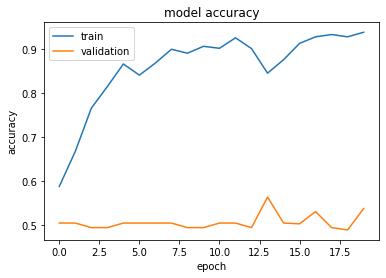

In [ ]:
# plot training accuracy
import matplotlib.pyplot as plt

def plot_hist(hist):
    plt.plot(hist.history["accuracy"])
    plt.plot(hist.history["val_accuracy"])
    plt.title("model accuracy")
    plt.ylabel("accuracy")
    plt.xlabel("epoch")
    plt.legend(["train", "validation"], loc="upper left")
    plt.show()

plot_hist(hist)

In [ ]:
# transfer learning from pre-trained weights
from tensorflow.keras.layers.experimental import preprocessing


def build_model(num_classes):
    inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    x = img_augmentation(inputs)
    model = EfficientNetB0(include_top=False, input_tensor=x, weights="imagenet")

    # Freeze the pretrained weights
    model.trainable = False

    # Rebuild top
    x = layers.GlobalAveragePooling2D(name="avg_pool")(model.output)
    x = layers.BatchNormalization()(x)

    top_dropout_rate = 0.2
    x = layers.Dropout(top_dropout_rate, name="top_dropout")(x)
    outputs = layers.Dense(NUM_CLASSES, activation="softmax", name="pred")(x)

    # Compile
    model = tf.keras.Model(inputs, outputs, name="EfficientNet")
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-2)
    model.compile(
        optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"]
    )
    return model


Epoch 1/40
21/21 - 16s - loss: 1.4372 - accuracy: 0.6481 - val_loss: 0.9342 - val_accuracy: 0.4948 - 16s/epoch - 760ms/step
Epoch 2/40
21/21 - 3s - loss: 0.7393 - accuracy: 0.7217 - val_loss: 1.0194 - val_accuracy: 0.4948 - 3s/epoch - 132ms/step
Epoch 3/40
21/21 - 3s - loss: 0.5226 - accuracy: 0.7760 - val_loss: 0.8003 - val_accuracy: 0.4948 - 3s/epoch - 131ms/step
Epoch 4/40
21/21 - 3s - loss: 0.5249 - accuracy: 0.7656 - val_loss: 0.7979 - val_accuracy: 0.4948 - 3s/epoch - 132ms/step
Epoch 5/40
21/21 - 3s - loss: 0.5536 - accuracy: 0.7708 - val_loss: 0.7583 - val_accuracy: 0.4948 - 3s/epoch - 133ms/step
Epoch 6/40
21/21 - 3s - loss: 0.5456 - accuracy: 0.7679 - val_loss: 0.6837 - val_accuracy: 0.4948 - 3s/epoch - 133ms/step
Epoch 7/40
21/21 - 3s - loss: 0.5385 - accuracy: 0.7664 - val_loss: 0.7873 - val_accuracy: 0.4948 - 3s/epoch - 132ms/step
Epoch 8/40
21/21 - 3s - loss: 0.5569 - accuracy: 0.7805 - val_loss: 0.7636 - val_accuracy: 0.4948 - 3s/epoch - 132ms/step
Epoch 9/40
21/21 - 3s 

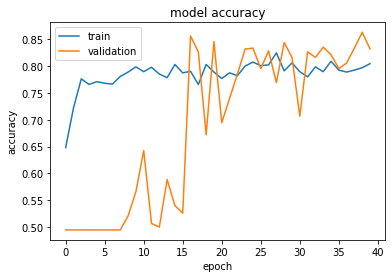

In [ ]:
# freeze layers and train top layers
with strategy.scope():
    model = build_model(num_classes=NUM_CLASSES)

epochs = 40
hist = model.fit(ds_train, epochs=epochs, validation_data=ds_test, verbose=2)
plot_hist(hist)

Epoch 1/40
21/21 - 15s - loss: 0.3485 - accuracy: 0.8393 - val_loss: 0.2982 - val_accuracy: 0.8559 - 15s/epoch - 730ms/step
Epoch 2/40
21/21 - 3s - loss: 0.3535 - accuracy: 0.8393 - val_loss: 0.3403 - val_accuracy: 0.8785 - 3s/epoch - 139ms/step
Epoch 3/40
21/21 - 3s - loss: 0.3650 - accuracy: 0.8348 - val_loss: 0.3003 - val_accuracy: 0.8802 - 3s/epoch - 140ms/step
Epoch 4/40
21/21 - 3s - loss: 0.3717 - accuracy: 0.8423 - val_loss: 0.7470 - val_accuracy: 0.5938 - 3s/epoch - 140ms/step
Epoch 5/40
21/21 - 3s - loss: 0.3468 - accuracy: 0.8504 - val_loss: 0.3600 - val_accuracy: 0.8212 - 3s/epoch - 140ms/step
Epoch 6/40
21/21 - 3s - loss: 0.3315 - accuracy: 0.8504 - val_loss: 0.3012 - val_accuracy: 0.8576 - 3s/epoch - 139ms/step
Epoch 7/40
21/21 - 3s - loss: 0.3526 - accuracy: 0.8438 - val_loss: 0.3397 - val_accuracy: 0.8247 - 3s/epoch - 141ms/step
Epoch 8/40
21/21 - 3s - loss: 0.3408 - accuracy: 0.8378 - val_loss: 0.4800 - val_accuracy: 0.8681 - 3s/epoch - 139ms/step
Epoch 9/40
21/21 - 3s 

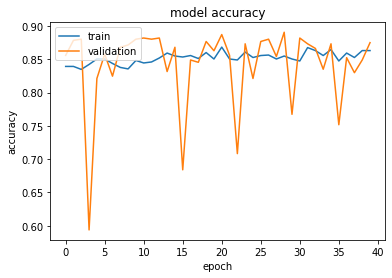

In [ ]:
def unfreeze_model(model):
    # We unfreeze the top 20 layers while leaving BatchNorm layers frozen
    for layer in model.layers[-20:]:
        if not isinstance(layer, layers.BatchNormalization):
            layer.trainable = True

    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)
    model.compile(
        optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"]
    )


unfreeze_model(model)

epochs = 40
hist = model.fit(ds_train, epochs=epochs, validation_data=ds_test, verbose=2)
plot_hist(hist)

## AlexNet/Mobilenet/Densenet

Text of image based on the image content using pre-trained AlexNet Model

In [ ]:
from torchvision import models
import torch
from PIL import Image
from torchvision import transforms
import torchvision.transforms as transforms
import pandas as pd
import numpy as np
from scipy.stats import entropy
import os
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
mobilenet = models.mobilenet_v2(pretrained=True)

In [ ]:
densenet = models.densenet161(pretrained=True)

In [ ]:
alexnet = models.alexnet(pretrained=True)

In [ ]:
resnet = models.resnet50(pretrained=True)

In [ ]:
#This is code that will transform images to the appropriate format
transformations = transforms.Compose([
    transforms.Resize(255),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
memes = pd.read_csv('drive/MyDrive/Colab Notebooks/meme_df/MEME-main/main_img_df.csv')

In [ ]:
meme_labels = list(memes['text'])[400:]

In [ ]:
quote_labels = list(meme_df['text'])[1000:]

In [ ]:
labels = meme_labels + quote_labels[:400]

In [ ]:
def top10(image_, model):
  img_t = transformations(image_)
  batch_t = torch.unsqueeze(img_t, 0)
  # pass through model
  prediction = model(batch_t)
  # sort predictions
  _, indices = torch.sort(prediction, descending=True)
  # get raw percentages using softmax and return top 10 percentages
  percentage = torch.nn.functional.softmax(prediction, dim=1)[0] * 100
  #percentage = percentage[:800]
  percentages_raw = [percentage[x].item() for x in range(0, len(percentage))] 
  top10 = []
  count = 0
  for idx in indices[0]:
    try:
      top10.append((labels[idx], percentage[idx].item()))
      count = count + 1
    except:
      continue
    if count == 10:
      break
  return top10

In [ ]:
def caption(image_, model, type='random'):
  batch_t = torch.unsqueeze(image_, 0)
  # pass through model
  prediction = model(batch_t)
  # sort predictions
  _, indices = torch.sort(prediction, descending=True)
  # get raw percentages using softmax and return top 10 percentages
  percentage = torch.nn.functional.softmax(prediction, dim=1)[0] * 100
  #percentage = percentage[:800]
  percentages_raw = [percentage[x].item() for x in range(0, len(percentage))] 
  top10 = []
  count = 0
  for idx in indices[0]:
    try:
      if type == 'random':
        top10.append((labels[idx], percentage[idx].item()))
      elif type == 'meme':
        top10.append((meme_labels[idx], percentage[idx].item()))
      else:
        top10.append((quote_labels[idx], percentage[idx].item()))
      count = count + 1
    except:
      continue
    if count == 1:
      break
  return top10[0][0]

In [ ]:
# try the model with a couple of images -- one for each label
images = []
path = 'drive/MyDrive/Colab Notebooks/meme_df/meme-generator-dataset/memegenimages/'
curr_path = path + meme_df['filenames'][0]
curr_meme = Image.open(curr_path)
images.append(curr_meme)

path = 'drive/MyDrive/Colab Notebooks/meme_df/meme-generator-dataset/inspirationalquotes/'
curr_path = path + meme_df['filenames'][1000]
curr_meme = Image.open(curr_path)
images.append(curr_meme)

In [ ]:
top10(images[0], mobilenet)

[("i ate famous amos cookies vENGA PA'CÁ M'HIJA!", 0.17789976298809052),
 ('all i want is an education and i am afraid of no one', 0.1607482135295868),
 ('Bored at night can sparkle too', 0.15657177567481995),
 ('How did I get on the history channel? так лучше?', 0.1553133875131607),
 ('new dlc is part of main story usar lentes oscuros en el metro debes',
  0.1460801512002945),
 ('if you want to help people you have to dive into people wade into the sea of humanity',
  0.14533214271068573),
 ('if anyone travels on a road in search of knowledge allah will cause him to travel on one of the roads of paradise',
  0.14482182264328003),
 ('Misses class lET U gO hOME?', 0.14466914534568787),
 ('Sunrise reminds us that while there are clouds in life, the beauty is in the way, the light shines through them.',
  0.1438901275396347),
 ('every decision we make today will be driven by fear or love who we toss the keys to determine a lot about the destination',
  0.14326441287994385)]

In [ ]:
top10(images[1], mobilenet)

[('Bored at night can sparkle too', 0.16309627890586853),
 ('all i want is an education and i am afraid of no one', 0.16152621805667877),
 ('every decision we make today will be driven by fear or love who we toss the keys to determine a lot about the destination',
  0.16026827692985535),
 ("i ate famous amos cookies vENGA PA'CÁ M'HIJA!", 0.15715450048446655),
 ('the only warmth i feel at night  FACIL ES 200.74.2.167',
  0.1512107253074646),
 ('that it shall not be just a day but last a lifetime through the miracle of christmastime that brings god close to you',
  0.14986880123615265),
 ('success is a lousy teacher teacher it seduces smart people into thinking they cant lose',
  0.14661791920661926),
 ('Take all the funny shit on r/trees Y u no use condom?!',
  0.1437484472990036),
 ('Reddit hoodie model is so he can use 1 to troll his team mates',
  0.14354248344898224),
 ('the universe doesnt give you what you ask for with your thoughts it gives you waht you demand with your actions',

In [ ]:
top10(images[0], densenet)

[('love is a smole made with the fume of sighs', 0.20898696780204773),
 ("just stole a woman's heart Knows roommate is there by the smell.",
  0.1896708905696869),
 ('gratitude and love are always freely multplied when you give freely it is an infinite source of contentment and prosperous energy',
  0.187705397605896),
 ('we have to hurt in order to know fall in order to grow lose in order to gain because most of lifes lessons are taught through pain',
  0.18102669715881348),
 ('Dont worry -', 0.1800624132156372),
 ('your attitude not your aptitude determines your altitude',
  0.17895834147930145),
 ('beth found you at museum? -', 0.17559291422367096),
 ("Never, ever, let anyone tell you what you can and can't do. Prove the cynics wrong. Pity them for they have no imagination. The sky's the limit. Your sky. Your limit. Now. Let's dance.",
  0.175521120429039),
 ('honesty is a very expensive gift dont expect it from cheap people',
  0.17424814403057098),
 ('The reality of the other pers

In [ ]:
top10(images[1], densenet)

[('love is a smole made with the fume of sighs', 0.20259010791778564),
 ('gratitude and love are always freely multplied when you give freely it is an infinite source of contentment and prosperous energy',
  0.19348303973674774),
 ("just stole a woman's heart Knows roommate is there by the smell.",
  0.19216875731945038),
 ('we have to hurt in order to know fall in order to grow lose in order to gain because most of lifes lessons are taught through pain',
  0.18387731909751892),
 ('Dont worry -', 0.18149782717227936),
 ('My name Paul you haz one', 0.176602303981781),
 ('your attitude not your aptitude determines your altitude',
  0.17522011697292328),
 ('The reality of the other person lies not in what he reveals to you, but what he cannot reveal to you. Therefore, if you would understand him, listen not to what he says, but rather to what he does not say.',
  0.1748662292957306),
 ('beth found you at museum? -', 0.1742905080318451),
 ("Never, ever, let anyone tell you what you can and

In [ ]:
top10(images[0], alexnet)

[('What happens in vegas gives her a blanket', 0.1044367328286171),
 ('a womans heart should be so hidden in god that a man has to seek him just to find her',
  0.10435618460178375),
 ('respect is earned honesty is appreciated trust is gained loyalty is returned',
  0.10394154489040375),
 ('Watches football -', 0.10374004393815994),
 ('the way of the dreamer is difficult but anything less is hardly living at all',
  0.10351600497961044),
 ('use the laws to achieve your objectives', 0.10326868295669556),
 ('id rather learn from one bird how to sing than teach ten thousand starts how not to dance',
  0.10322048515081406),
 ('getting over a painful experience is much like corssing monkey bars you have to let go at some point in order to move forward',
  0.1031562089920044),
 ('freedom is nothing else but a chance to be better', 0.10313545167446136),
 ('there is never enough time to do everything but there is always enough time to do the most important thing',
  0.10311700403690338)]

In [ ]:
top10(images[1], alexnet)

[('nothing brings me more happiness than trying to help the most vulnerable people in society it is a goal and an essential part of my life a kind of destiny whoever is in distress can call on me i will come running wherever they are',
  0.10415582358837128),
 ('a womans heart should be so hidden in god that a man has to seek him just to find her',
  0.1039750725030899),
 ('What happens in vegas gives her a blanket', 0.10375893115997314),
 ('life is not ties with a bow but still it is a gift', 0.10361526161432266),
 ('you good sir have been looking at memebase for over a hour я крута',
  0.10359043627977371),
 ('id rather learn from one bird how to sing than teach ten thousand starts how not to dance',
  0.10311831533908844),
 ('In soviet russia, you shit on government saber solo el coro',
  0.10294482111930847),
 ('this is my widh for you laughter to kiss your lips beauty for your eyes to see sunsets to warm your heart rainbows to follow the clouds smiles when sadness intrudes hugs wh

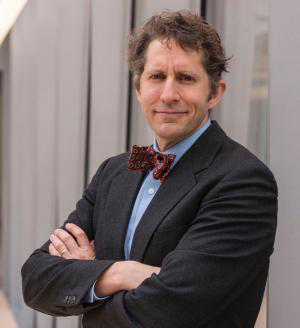

In [ ]:
image = Image.open('drive/MyDrive/Colab Notebooks/meme_df/meme-generator-dataset/trial_imgs/trial_img1.jpg')
image

In [ ]:
img_t = transformations(image)
caption(img_t, alexnet, 'meme')

'facebook: exists. old white people: this is the perfect place for me to play out my political agenda'

In [ ]:
caption(img_t, alexnet, 'quote')

'do not pray for easy lives pray to be stronger men'

In [ ]:
caption(img_t, alexnet, 'random')

'if you get tired, learn to rest, not to quit.'

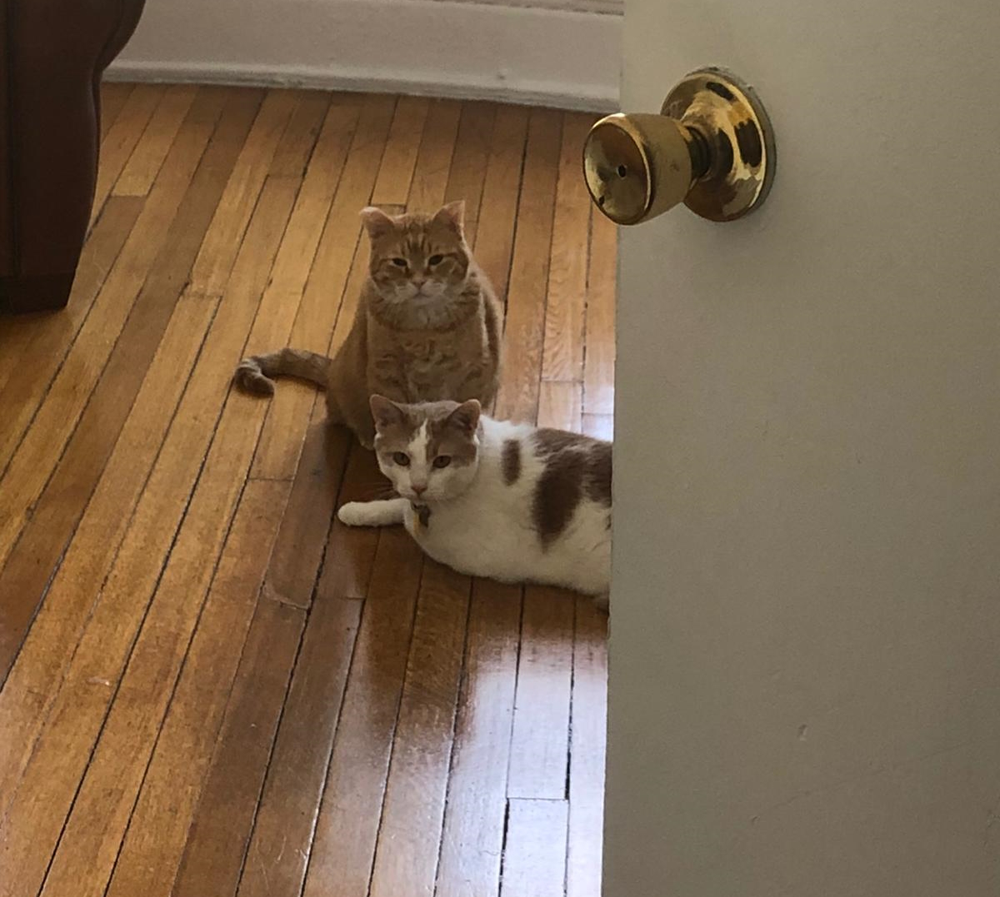

In [ ]:
image = Image.open('drive/MyDrive/Colab Notebooks/meme_df/meme-generator-dataset/trial_imgs/trial_img9.jpg')
image

In [ ]:
img_t = transformations(image)
caption(img_t, alexnet, 'meme')

'so he left the bacon completely unguarded on the counter?'

In [ ]:
caption(img_t, alexnet, 'quote')

'there is nothing so fatal to character as half finished tasks'

In [ ]:
caption(img_t, alexnet, 'random')

'the desire to reach for the stars is ambitious the desire to reach hearts is wise'

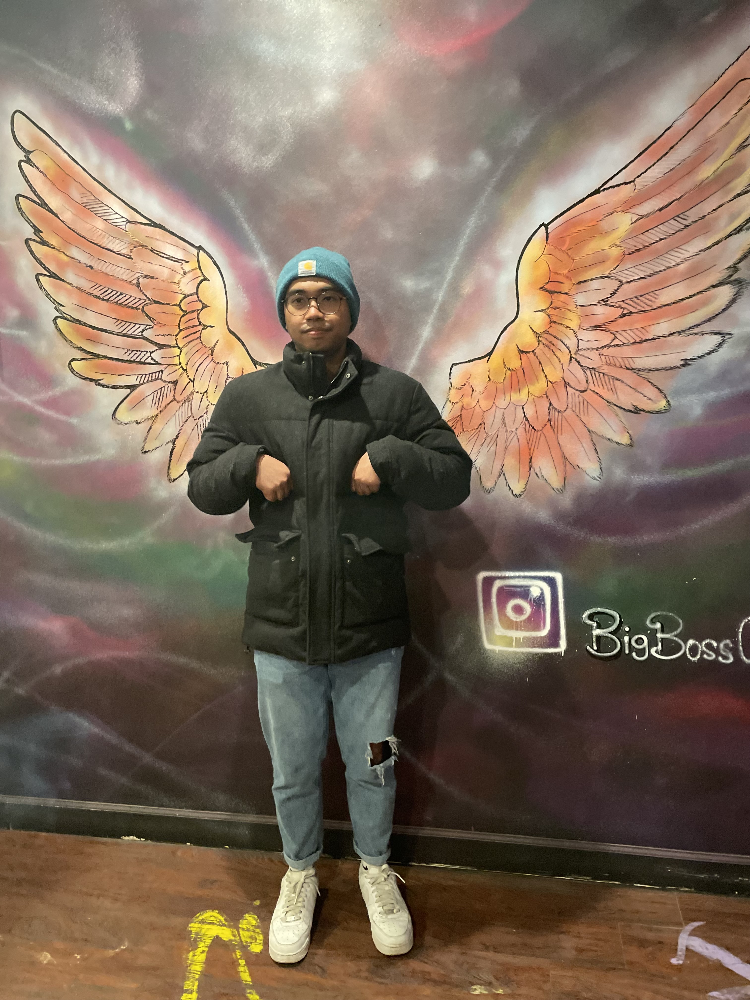

In [ ]:
image = Image.open('drive/MyDrive/Colab Notebooks/meme_df/meme-generator-dataset/trial_imgs/trial_img4.jpg')
image

In [ ]:
img_t = transformations(image)
caption(img_t, alexnet, 'meme')

'when you see your friend gurt'

In [ ]:
caption(img_t, alexnet, 'quote')

'let us keep christmas beautiful without a thought of greed that it might live forevermore to fill our every need'

In [ ]:
caption(img_t, alexnet, 'random')

'there is a song written on your heart and you must sing it the world is waiting needing what it is you have to offer'

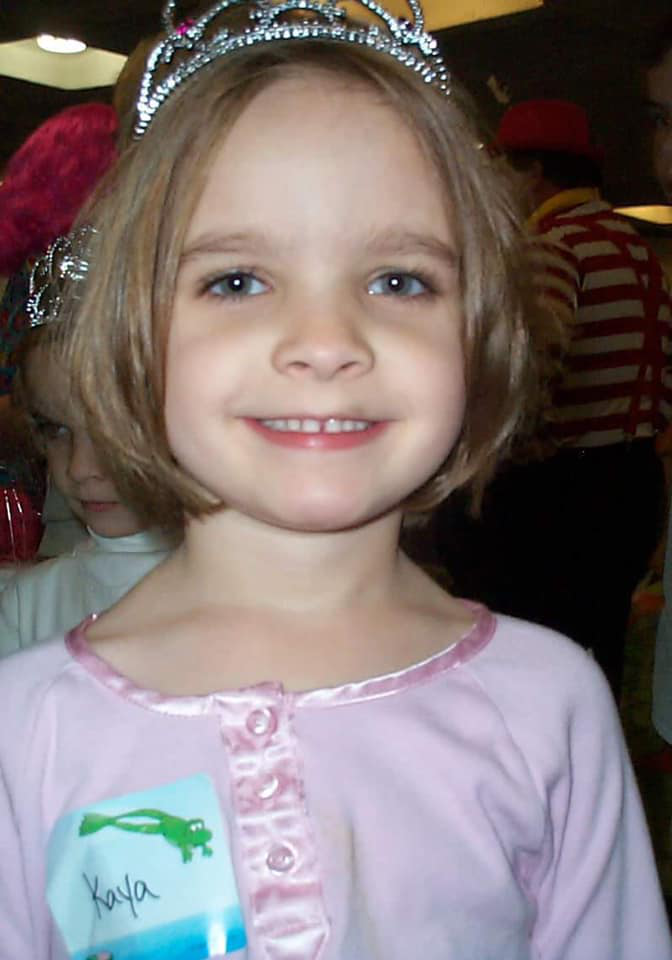

In [ ]:
image = Image.open('drive/MyDrive/Colab Notebooks/meme_df/meme-generator-dataset/trial_imgs/trial_img5.jpg')
image

In [ ]:
img_t = transformations(image)
caption(img_t, alexnet, 'meme')

"i'll make my own star wars trilogy with blackjack and hookers"

In [ ]:
caption(img_t, alexnet, 'quote')

'your life does not get better by chance it gets better by change'

## Similarity Queries



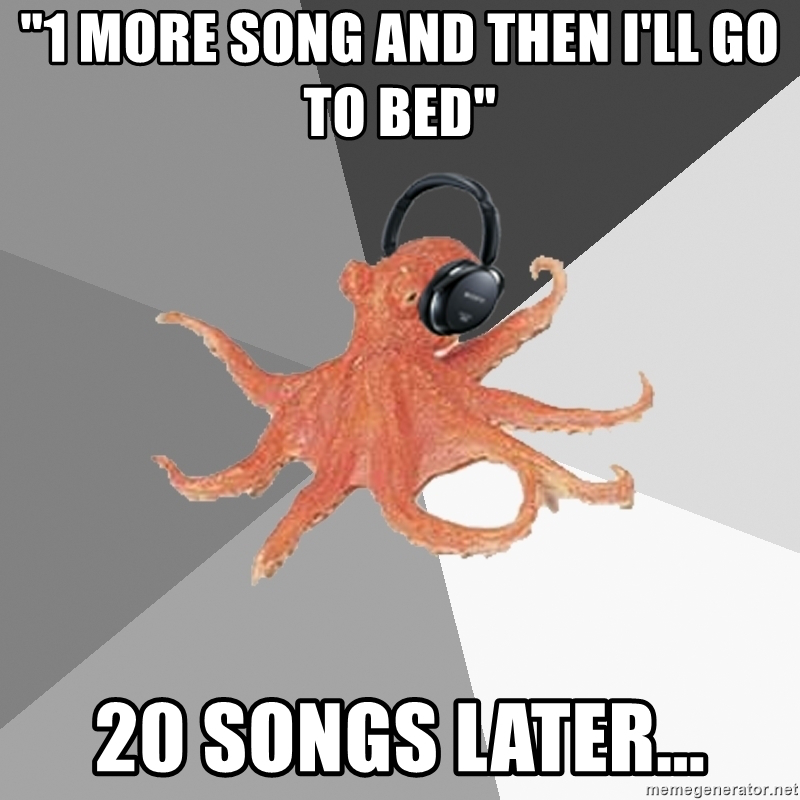

In [ ]:
curr_path = 'drive/MyDrive/Colab Notebooks/meme_df/meme-generator-dataset/memegenimages/10214171.jpg'
from PIL import Image
curr_meme = Image.open(curr_path)
curr_meme

In [ ]:
import matplotlib.pyplot as plt

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


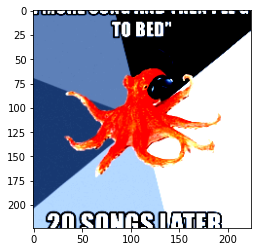

In [ ]:
from skimage.io import imshow, imsave, imread
import torch
import torchvision
import torch.nn as nn
transforms = torchvision.transforms.Compose([
    torchvision.transforms.Resize(256),
    torchvision.transforms.CenterCrop(224),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
curr_meme = Image.open(curr_path)
curr_meme = transforms(curr_meme)
curr_meme = curr_meme.permute(1, 2, 0)
plt.imshow(curr_meme)